In [1]:
! pip install pytorch_lightning==1.8.3 pytorch_metric_learning==1.6.3
! pip install faiss-gpu
! apt install libomp-dev

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.9/798.9 KB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.4/111.4 KB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 KB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 KB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 KB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 37.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 KB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 KB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 KB 33.7 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.5.0-py2.py3-none-any.whl size=116952 sha256=02042781927855f1c624e7f39ab26273622dbdf30b637244

In [6]:
import random
import torchvision
import torch
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objs as go
import plotly.offline as py
# Restart the environment if crashes.
from pytorch_metric_learning.utils.accuracy_calculator import AccuracyCalculator
from collections import defaultdict
py.init_notebook_mode()

# Семинар 8. Metric Learning.
В данном семинаре мы реализуем несколько подходов Metric Learning, а также визуализируем их работу. Будем обучаться на датасете [CIFAR10](https://www.cs.toronto.edu/~kriz/cifar.html). Это небольшой датасет из 10-ти категорий, на котором мы быстро сможем получать результаты.

In [3]:
! nvidia-smi

Fri Apr  7 17:02:02 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
"""
Вспомогательные классы для датасета и семплера. На семинаре сюда заглядывать не придётся.
"""

class TransformDataset(torch.utils.data.Dataset):
    """Apply transform to the dataset."""

    def __init__(self, dataset, transform):
        super().__init__()
        self._transform = transform
        self.dataset = dataset

    def __getitem__(self, index):
        """Get element of the dataset."""
        item = self.dataset[index]
        image = self._transform(item[0])
        return (image,) + item[1:]
    
    def __len__(self):
        return len(self.dataset)


class UniformLabelsSampler:
    """Sample labels with equal probabilities."""
    def __init__(self, labels, labels_per_batch, num_batches):
        self._labels = set(labels)
        self._labels_per_batch = labels_per_batch
        self._num_batches = num_batches
        if len(self._labels) < labels_per_batch:
            raise ValueError("Can't sample equal number of labels. Batch is too large.")

    def __iter__(self):
        labels = list(self._labels)
        i = 0
        for _ in range(self._num_batches):
            if i + self._labels_per_batch > len(labels):
                random.shuffle(labels)
                i = 0
            yield list(labels[i:i + self._labels_per_batch])
            i += self._labels_per_batch


class ShuffledClassBalancedBatchSampler(torch.utils.data.Sampler):
    """Sampler which extracts balanced number of samples for each class.

    Args:
        data_source: Source dataset. Labels field must be implemented.
        batch_size: Required batch size.
        samples_per_class: Number of samples for each class in the batch.
            Batch size must be a multiple of samples_per_class.
        uniform: If true, sample labels uniformly. If false, sample labels according to frequency.
    """

    def __init__(self, data_source, batch_size, samples_per_class):
        if batch_size > len(data_source):
            raise ValueError("Dataset size {} is too small for batch size {}.".format(
                len(data_source), batch_size))
        if batch_size % samples_per_class != 0:
            raise ValueError("Batch size must be a multiple of samples_per_class, but {} != K * {}.".format(
                batch_size, samples_per_class))

        self._data_source = data_source
        self._batch_size = batch_size
        self._labels_per_batch = self._batch_size // samples_per_class
        self._samples_per_class = samples_per_class
        labels = [i[1] for i in data_source]
        self._label_sampler = UniformLabelsSampler(labels, self._labels_per_batch,
                                                   num_batches=len(self))

        by_label = defaultdict(list)
        for i, label in enumerate(labels):
            by_label[label].append(i)
        self._by_label = list(by_label.values())
        if self._labels_per_batch > len(self._by_label):
            raise ValueError("Can't sample {} classes from dataset with {} classes.".format(
                self._labels_per_batch, len(self._by_label)))

    @property
    def batch_size(self):
        return self._batch_size

    def __iter__(self):
        for labels in self._label_sampler:
            batch = []
            for label in labels:
                batch.extend(np.random.choice(self._by_label[label], size=self._samples_per_class, replace=True))
            yield batch

    def __len__(self):
        num_samples = len(self._data_source)
        num_batches = num_samples // self._batch_size
        return num_batches

In [7]:
"""
Функции для визуализации эмбеддингов в 2D и 3D. Можно ознакомиться с кодом после семинара, если понравятся картинки.
"""

LAYOUT = go.Layout(
    title='CIFAR100 3D embeddings',
    scene=dict(
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        zaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        )
    )
)


def visualize_embeddings(embs, labels):
    if embs.shape[1] == 2:
        _visualize_2d(embs, labels)
    elif embs.shape[1] == 3:
        _visualize_3d(embs, labels)


def _visualize_2d(embs, labels):
    plt.figure(figsize=(10, 10))
    for l in np.unique(labels):
        plt.scatter(*embs[labels == l].T, alpha=0.5)


def create_spferical_surface(colorscale):
    pi = np.pi
    cos = np.cos
    sin = np.sin
    phi, theta = np.mgrid[0.0:pi:50j, 0.0:2.0*pi:50j]
    r = 1.0
    x = r*sin(phi)*cos(theta)
    y = r*sin(phi)*sin(theta)
    z = r*cos(phi)
    surface = go.Surface(
        x=x, y=y, z=z,
        colorscale=colorscale,
        showscale=False
    )
    return surface


def create_embeddings_scatter(embeddings):
    scatter = go.Scatter3d(
        x=embeddings.T[0],
        y=embeddings.T[1],
        z=embeddings.T[2],
        mode='markers',
        marker_size=2.5,
    )
    return scatter


def _visualize_3d(embs, labels):
    embs = embs / (np.sqrt((embs ** 2).sum(-1))[..., np.newaxis] * (1 - 0.02))
    surface = create_spferical_surface("greys")

    classes = np.unique(labels)
    embeddings = []
    for c in classes:
        class_embeddings = embs[labels == c]
        embeddings.append(create_embeddings_scatter(class_embeddings))
            
    data = [surface, *embeddings]

    fig = go.Figure(data=data, layout=LAYOUT)
    py.iplot(fig)
    fig.write_html("./3dvis.html")

In [10]:
class ResNet18Backbone(torch.nn.Module):
    def __init__(self, dim=2):
        # TODO in task 1
        super().__init__()
        self.model = getattr(torchvision.models, "resnet18")(pretrained=True)
        self.model.fc = torch.nn.Linear(in_features=self.model.fc.in_features, out_features=dim)

    def forward(self, input):
        x = self.model(input)
        return x

In [27]:
def generate_triplets(batch):
    images, labels = batch
    indices = torch.arange(0, len(labels))
    anchors_indices = torch.tensor(np.random.choice(indices, len(labels))).to(labels.device)
    indices = indices.to(labels.device)

    positive_indices, negative_indices = [], []
    for i_a in anchors_indices:
        positive_indices.append(random.choice(indices[labels == labels[i_a]]))
        negative_indices.append(random.choice(indices[labels != labels[i_a]]))
    
    anchors = images[anchors_indices], labels[anchors_indices]
    positives = images[positive_indices], labels[positive_indices]
    negatives = images[negative_indices], labels[negative_indices]

    return anchors, positives, negatives


def test_triplets():
  batch = torch.tensor(np.arange(256)), torch.tensor(np.array([[i] * (256 // 8) for i in range(8)]).flatten())
  triplets = generate_triplets(batch)
  assert all([len(e[0]) == len(batch[0]) for e in triplets]), "Number of triplets shold be equal to batch size."
  assert all([len(e[1]) == len(batch[1]) for e in triplets]), "Number of triplets shold be equal to batch size."
  assert all(triplets[0][1] == triplets[1][1]), "Anchor's label should be equal to positive's label."
  assert all(triplets[0][1] != triplets[2][1]), "Anchor's label shouldn't be equal to negative's label."
  assert all([all(batch[1][e[0]] == e[1]) for e in triplets]), "Incorrect labels in triplets."
  assert all([isinstance(e[0], torch.Tensor) and isinstance(e[0], torch.Tensor) for e in triplets]), "Output arrays should be torch.Tensor type."
test_triplets()

In [28]:
class TriptetLoss:
    def __init__(self, margin=10):
        # TODO in task 3
        self.margin = margin
    def __call__(self, triplets):
        # TODO in task 3
        anchors, positives, negatives = triplets[0][0], triplets[1][0], triplets[2][0]
        # anchors - (B, E)
        dist_a_p = torch.norm(anchors - positives, dim=1) # (B)
        dist_a_n = torch.norm(anchors - negatives, dim=1) # (B)
        loss = torch.clamp(dist_a_p - dist_a_n + self.margin, min=0) # (B)
        loss_reduced = torch.mean(loss)
        return loss_reduced

\begin{equation}
L_{\text{CosFace}}=\frac{1}{N} \sum_i-\log \frac{e^{s\left(\cos \left(\theta_{y_i, i}\right)-m\right)}}{e^{s\left(\cos \left(\theta_{y_i, i}\right)-m\right)}+\sum_{j \neq y_i} e^{s \cos \left(\theta_{j, i}\right)}}
\end{equation}


In [34]:
class CosFaceClassifier(torch.nn.Linear):
    def __init__(self, in_features, out_features, scale=64.0, margin=0.35):
        # TODO in task 4
        super().__init__(in_features, out_features, bias=None)
        self.m = margin
        self.s = scale
    
    def forward(self, input, label):
        # TODO in task 4
        cosines = torch.nn.functional.linear(torch.nn.functional.normalize(input),
                                             torch.nn.functional.normalize(self.weight))
        one_hot = torch.nn.functional.one_hot(label.long(), num_classes=self.weight.size()[0])
        logits = self.s * (cosines - one_hot * self.m)
        return logits


def test_cosface():
    classifier = CosFaceClassifier(2, 2, scale=2., margin=.5)
    classifier.weight = torch.nn.Parameter(torch.Tensor([[1., 2.], [3., 4.]]))
    inputs = torch.Tensor([[1.0, 0.0], [0.0, 1.0]])
    labels = torch.Tensor([0, 1])
    logits = classifier(inputs, labels)
    true_cosine = np.array([[1 / np.sqrt(5), 3 / 5], [2 / np.sqrt(5), 4 / 5]])
    true_logits = 2 * (true_cosine - np.eye(2) * 0.5)
    assert np.allclose(logits.detach().numpy(), true_logits)

test_cosface()

In [35]:
"""
Основной код пайплайна на фреймворке Pytorch Lightning. Разберём на семинаре.
"""


CRITERIONS = {
    "ce": torch.nn.CrossEntropyLoss,
    "triplet": TriptetLoss
}


CLASSIFIERS = {
    "linear": torch.nn.Linear,
    "cosface": CosFaceClassifier
}


class CIFAR10Module(pl.LightningModule):
    def __init__(self, config):
        super().__init__()
        self._config = config
        self.embedder = ResNet18Backbone(dim=config["dim"])
        self.classifier = self.get_classifier()
        self.criterion = self.get_criterion()
        self.recall_calculator = AccuracyCalculator(
            include=("precision_at_1", "mean_average_precision_at_r"), k="max_bin_count"
        )
  
    def train_dataset(self):
        CIFAR_trainset = torchvision.datasets.CIFAR10(
            root='./data', train=True, download=True
        )
        CIFAR_testset = torchvision.datasets.CIFAR10(
            root='./data', train=False, download=True
        )
        transform = torchvision.transforms.Compose(
            [torchvision.transforms.AutoAugment(torchvision.transforms.AutoAugmentPolicy.CIFAR10),
            torchvision.transforms.ToTensor()]
        )
        return TransformDataset(CIFAR_trainset, transform)

    def train_dataloader(self):
        dataset = self.train_dataset()
        params = self._config["dataset_params"]
        if "use_balanced_sampler" in params and params["use_balanced_sampler"]:
            sampler = ShuffledClassBalancedBatchSampler(
                dataset, params["batch_size"], params["samples_per_class"]
            )
            return torch.utils.data.DataLoader(
                dataset, batch_sampler=sampler, num_workers=12
            )
        else:
            return torch.utils.data.DataLoader(
                dataset, params["batch_size"], num_workers=12
            )
    
    def test_dataset(self):
        CIFAR_trainset = torchvision.datasets.CIFAR10(
            root='./data', train=True, download=True, 
            transform=torchvision.transforms.ToTensor()
        )
        CIFAR_testset = torchvision.datasets.CIFAR10(
            root='./data', train=False, download=True,
            transform=torchvision.transforms.ToTensor()
        )
        return CIFAR_testset
  
    def test_dataloader(self):
        dataset = self.test_dataset()
        params = self._config["dataset_params"]
        return torch.utils.data.DataLoader(
            dataset, batch_size = params["batch_size"], num_workers=12
        )
  
    def val_dataloader(self):
        return self.test_dataloader()
  
    def configure_optimizers(self):
        params = self._config["optimizer_params"]
        optimizer = torch.optim.SGD(self.parameters(), **params)
        return optimizer
    
    def get_criterion(self):
        criterion_type = self._config["criterion_type"]
        params = self._config["criterion_params"] if "criterion_params" in self._config else {}
        return CRITERIONS[criterion_type](**params)
    
    def get_classifier(self):
        classifier_type = self._config["classifier_type"]
        params = self._config["classifier_params"] if "classifier_params" in self._config else {}
        return CLASSIFIERS[classifier_type](self.embedder.model.fc.out_features, 10, **params)
    
    def training_step(self, batch, batch_idx):
        images, labels = batch
        embeddings = self.embedder(images)
        if isinstance(self.criterion, torch.nn.CrossEntropyLoss):
            if isinstance(self.classifier, CosFaceClassifier):
                logits = self.classifier(embeddings, labels)
            else:
                logits = self.classifier(embeddings)
            loss = self.criterion(logits, labels)
        elif isinstance(self.criterion, TriptetLoss):
            triplets = generate_triplets((embeddings, labels))
            loss = self.criterion(triplets)
        self.log("loss", loss)
        return {"loss": loss}
    
    def test_step(self, batch, batch_idx):
        images, labels = batch
        embeddings = self.embedder(images)
        return {"embeddings": embeddings.cpu(), "labels": labels.cpu()}
    
    def test_epoch_end(self, outputs) -> None:
        embeddings = np.vstack([b["embeddings"].numpy() for b in outputs])
        labels = np.hstack([b["labels"].numpy() for b in outputs])
        visualize_embeddings(embeddings, labels)
        if embeddings.shape[1] == 3:
            embeddings = embeddings / np.sqrt((embeddings ** 2).sum(-1))[..., np.newaxis]
        metrics = self.recall_calculator.get_accuracy(
            embeddings, embeddings,
            labels, labels,
            embeddings_come_from_same_source=True
        )
        self.log("r_at_one", metrics["precision_at_1"])
        self.log("map_at_r", metrics["mean_average_precision_at_r"])
    
    def validation_step(self, batch, batch_idx):
        return self.test_step(batch, batch_idx)
    
    def validation_epoch_end(self, outputs) -> None:
        embeddings = np.vstack([b["embeddings"].numpy() for b in outputs])
        labels = np.hstack([b["labels"].numpy() for b in outputs])
        metrics = self.recall_calculator.get_accuracy(
            embeddings, embeddings,
            labels, labels,
            embeddings_come_from_same_source=True
        )
        self.log("val_r_at_one", metrics["precision_at_1"])
        self.log("val_map_at_r", metrics["mean_average_precision_at_r"])

## Задание 1. Разминка.
Мы хотим посмотреть на пространство эмбеддингов, которое формирует обычный классификатор, 
обученный с CE. В классе `Resnet18Backbone` добавьте возможность изменять выходную размерность последнего линейного слоя. Поставьте её равной 2. Это понадобится нам для визуализации эмбеддингов.

Запустите пайплайн и убедитесь, что всё работает. Должны появиться метрики на тесте и визуализация эмбеддингов.

In [17]:
# All logs here.
%reload_ext tensorboard
%tensorboard --logdir logs/

Reusing TensorBoard on port 6006 (pid 6362), started 0:09:22 ago. (Use '!kill 6362' to kill it.)

<IPython.core.display.Javascript object>

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:p

Sanity Checking: 0it [00:00, ?it/s]

Files already downloaded and verified
Files already downloaded and verified


/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:561: UserWarning:

This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.

/usr/local/lib/python3.9/dist-packages/faiss/contrib/torch_utils.py:51: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()

/usr/local/lib/python3.9/dist-packages/faiss/contrib/torch_utils.py:65: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. Thi

Files already downloaded and verified
Files already downloaded and verified


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:134: UserWarning:

`.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at ./logs/ce/version_0/checkpoints/epoch=9-step=1960.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from checkpoint at ./logs/ce/version_0/checkpoints/epoch=9-step=1960.ckpt


Files already downloaded and verified
Files already downloaded and verified


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         map_at_r          │    0.3790092468261719     │
│         r_at_one          │    0.6959999799728394     │
└───────────────────────────┴───────────────────────────┘

[{'r_at_one': 0.6959999799728394, 'map_at_r': 0.3790092468261719}]

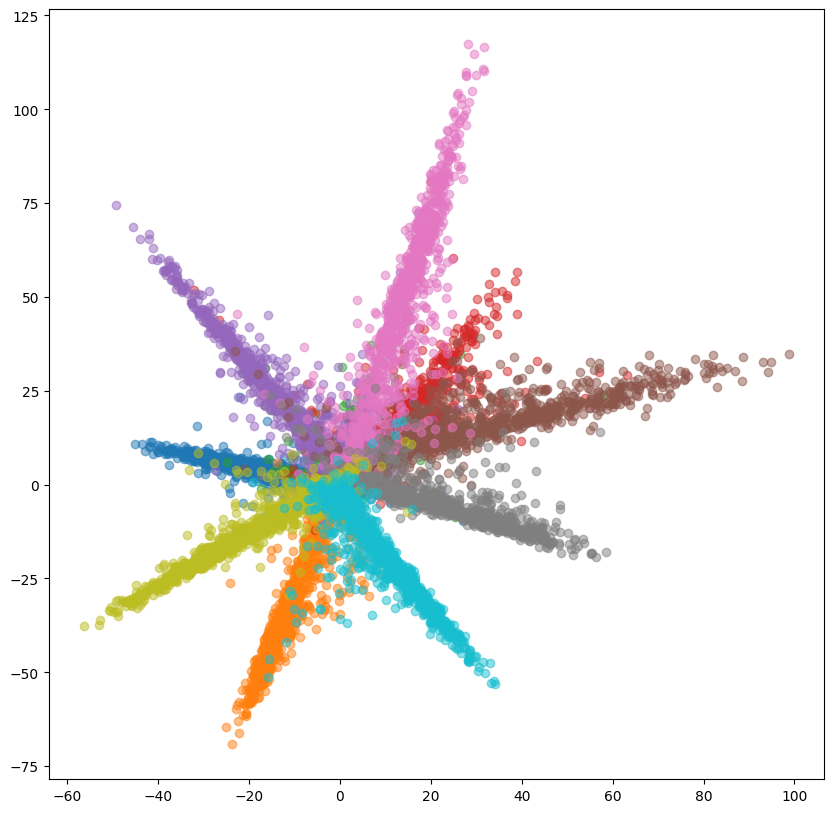

In [18]:
config = {
    "dim": 2,
    "criterion_type": "ce",
    "classifier_type": "linear",
    "optimizer_params": {
        "lr": 0.005,
        "momentum": 0.9
    },
    "dataset_params": {
        "batch_size": 256
    }
}
module = CIFAR10Module(config)
logger = pl.loggers.TensorBoardLogger("./logs", name='ce')
trainer = pl.Trainer(
    accelerator="gpu",
    logger=logger,
    log_every_n_steps=10,
    max_epochs=10
)
trainer.fit(module)
trainer.test()

## Задание 2. Генерируем триплеты.
Реализуйте функцию, которая генерирует триплеты для дальнейшего обучения с Triplet Loss:
```
generate_triplets((images[B x 3 x 32 x 32], labels[B]))
|
v
(anchor_images[B x 3 x 32 x 32], anchor_labels[B]),
(positive_images[B x 3 x 32 x 32], positive_labels[B]),
(negative_images[B x 3 x 32 x 32], negative_labels[B])
```
B - batch size. Метки anchor и positive совпадают, anchor и negative - различаются. Проверьте, что тесты не падают.


## Задание 3. Triplet Loss.
Итак, мы умеем семплировать триплеты. В этом задании нужно реализовать Triplet Loss:
\begin{equation}
L_{\text {triplet }}=\left[d_{a p}-d_{a n}+m\right]_{+}
\end{equation}
m - margin, $d_{a p}$ - L2 расстояние между anchor и positive, $d_{a n}$ - L2 расстояние между anchor и negative.
Предлагается работать с заготовкой класса `TripletLoss`. Не забудьте про margin и усреднить лосс по батчу.
Обучите модель с новым лоссом.

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:p

Sanity Checking: 0it [00:00, ?it/s]

Files already downloaded and verified
Files already downloaded and verified


/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:561: UserWarning:

This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.

/usr/local/lib/python3.9/dist-packages/faiss/contrib/torch_utils.py:51: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()

/usr/local/lib/python3.9/dist-packages/faiss/contrib/torch_utils.py:65: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. Thi

Files already downloaded and verified
Files already downloaded and verified


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:134: UserWarning:

`.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at ./logs/triplet/version_0/checkpoints/epoch=9-step=1950.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from checkpoint at ./logs/triplet/version_0/checkpoints/epoch=9-step=1950.ckpt


Files already downloaded and verified
Files already downloaded and verified


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         map_at_r          │    0.33543550968170166    │
│         r_at_one          │    0.5641999840736389     │
└───────────────────────────┴───────────────────────────┘

[{'r_at_one': 0.5641999840736389, 'map_at_r': 0.33543550968170166}]

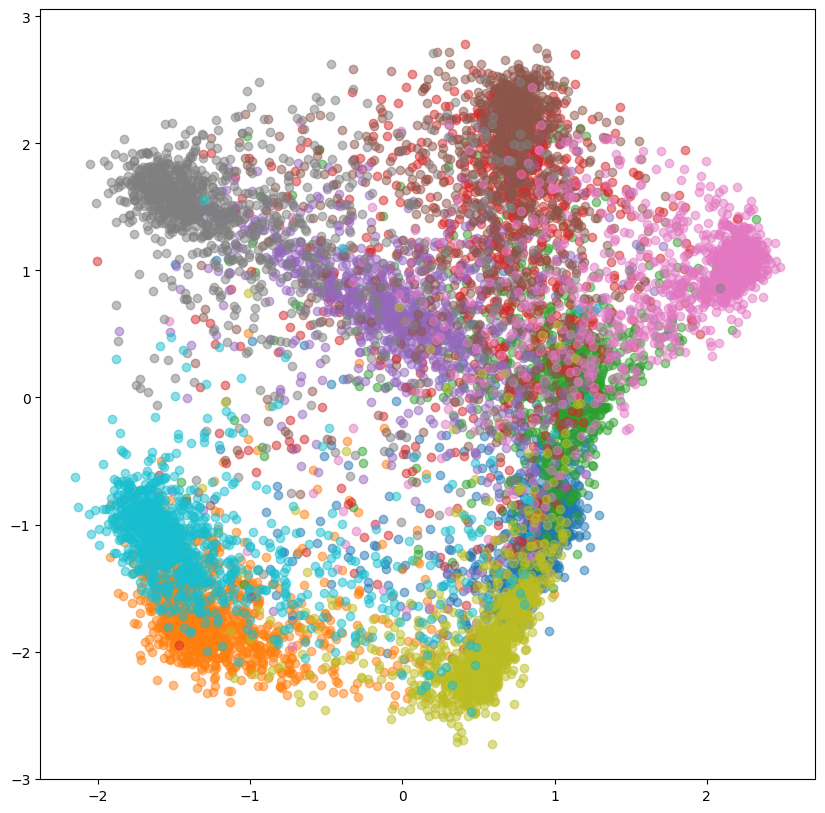

In [31]:
config = {
    "dim": 2,
    "criterion_type": "triplet",
    "criterion_params": {
        "margin": 1.0
    },
    "classifier_type": "linear",
    "optimizer_params": {
        "lr": 0.005,
        "momentum": 0.9
    },
    "dataset_params": {
        "batch_size": 256,
        "use_balanced_sampler": True,
        "samples_per_class": 32
    }
}
module = CIFAR10Module(config)
logger = pl.loggers.TensorBoardLogger("./logs", name='triplet')
trainer = pl.Trainer(
    accelerator="gpu",
    logger=logger,
    log_every_n_steps=10,
    max_epochs=10
)
trainer.fit(module)
trainer.test()

## Задание 4. Spherical Embeddings.
Реализовать CosFace:
\begin{equation}
L_{\text{CosFace}}=\frac{1}{N} \sum_i-\log \frac{e^{s\left(\cos \left(\theta_{y_i, i}\right)-m\right)}}{e^{s\left(\cos \left(\theta_{y_i, i}\right)-m\right)}+\sum_{j \neq y_i} e^{s \cos \left(\theta_{j, i}\right)}}
\end{equation}
Предлагается использовать заготовку класса `CosFaceClassifier`. Тест в той же ячейке. Рекомендую один раз выписать полученные логиты руками для закрепления материала.

**Советы**

1. Обратите внимание, что необходимый лосс получится, если передать в `CrossEntropyLoss` $s\left(\cos \left(\theta_{y_i, i}\right)-m\right)$ и $s \cos \left(\theta_{j, i}\right)$ в качестве логитов.

2. Вам с большой вероятностью потребуются функцию `TORCH.NN.FUNCTIONAL.ONE_HOT`. Посмотрите документацию.

In [36]:
config = {
    "dim": 3,
    "criterion_type": "ce",
    "classifier_type": "cosface",
    "classifier_params": {
        "scale": 64.0,
        "margin": 0.05
    },
    "optimizer_params": {
        "lr": 0.001,
        "momentum": 0.9
    },
    "dataset_params": {
        "batch_size": 64,
    }
}
module = CIFAR10Module(config)
logger = pl.loggers.TensorBoardLogger("./logs", name='cosface')
trainer = pl.Trainer(
    accelerator="gpu",
    logger=logger,
    log_every_n_steps=10,
    max_epochs=10
)
trainer.fit(module)
trainer.test()

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:p

Sanity Checking: 0it [00:00, ?it/s]

Files already downloaded and verified
Files already downloaded and verified


/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:561: UserWarning:

This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.

/usr/local/lib/python3.9/dist-packages/faiss/contrib/torch_utils.py:51: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()

/usr/local/lib/python3.9/dist-packages/faiss/contrib/torch_utils.py:65: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. Thi

Files already downloaded and verified
Files already downloaded and verified


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:134: UserWarning:

`.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at ./logs/cosface/version_0/checkpoints/epoch=9-step=7820.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from checkpoint at ./logs/cosface/version_0/checkpoints/epoch=9-step=7820.ckpt


Files already downloaded and verified
Files already downloaded and verified


Testing: 0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/faiss/contrib/torch_utils.py:51: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()

/usr/local/lib/python3.9/dist-packages/faiss/contrib/torch_utils.py:65: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         map_at_r          │    0.3162005841732025     │
│         r_at_one          │    0.6389999985694885     │
└───────────────────────────┴───────────────────────────┘

[{'r_at_one': 0.6389999985694885, 'map_at_r': 0.3162005841732025}]

## Задание 5*. Повышаем размерности.

На практике эмбеддинги размерности 2 практически не используются. В реальных приложениях размерности начинаются от 128. Давайте посмотрим, как ведут себя модели при этих размерностях, и обсудим результаты.